## About

- Project purpose
    -  Detect cancer in gigapixel pathology images.

- Dataset
    - Our dataset used in this project is from [CAMELYON16](https://camelyon16.grand-challenge.org/Data/)
    
    400 WSI (whole slide images) collected independently from two medical centers in the Netherlands.
    
        - Slide level annotations.
        - Importantly, licensed under CC0.
        - About 600GB.
        
    We use 10 slides among them with 10 matched masks in this project from this [fold](https://drive.google.com/drive/folders/1rwWL8zU9v0M27BtQKI52bF6bVLW82RL5?usp=sharing). We use 8 images to train and 2 image to test.
- Approach
    - Rather than use the method from [Detecting Cancer Metastases on
Gigapixel Pathology Images](https://arxiv.org/pdf/1703.02442.pdf). We decide to try something different. Semantic segmentation is a method to associate each pixel of an image with a class label, which gives us an end to end system to predict cancer. We use [8 layer Fully-convolutional network](https://people.eecs.berkeley.edu/~jonlong/long_shelhamer_fcn.pdf) trying to solve this probelm.

## Setup Environment

In [0]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [3]:
!nvidia-smi

Sun May 19 03:31:18 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.67       Driver Version: 410.79       CUDA Version: 10.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P8    16W /  70W |      0MiB / 15079MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

GPU is fired up and ready to go.

## Load data

In this part, we will install some dependency and import some python packages. The data would be read from my google drive. We provide another way to read the file from upload because the mounted google drive is not stable and we got into input/output error several times.

In [4]:
# Install the OpenSlide C library and Python bindings
!apt-get install openslide-tools
!pip install openslide-python
!pip install -q tensorflow-gpu==2.0.0-alpha0

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-410
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  libopenslide0
Suggested packages:
  libtiff-tools
The following NEW packages will be installed:
  libopenslide0 openslide-tools
0 upgraded, 2 newly installed, 0 to remove and 7 not upgraded.
Need to get 92.5 kB of archives.
After this operation, 268 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libopenslide0 amd64 3.4.1+dfsg-2 [79.8 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 openslide-tools amd64 3.4.1+dfsg-2 [12.7 kB]
Fetched 92.5 kB in 1s (96.9 kB/s)
Selecting previously unselected package libopenslide0.
(Reading database ... 130824 files and directories currently installed.)
Preparing to unpack .../libopenslide0_3.4.1+dfsg-2

In [0]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from openslide import open_slide, __library_version__ as openslide_version
import os
import os.path as osp
from PIL import Image
from skimage.color import rgb2gray
import openslide
from pathlib import Path
import time
import datetime
from skimage.filters import threshold_otsu
from openslide.deepzoom import DeepZoomGenerator 

In [6]:
# Mount my google drive on colab.
from google.colab import drive
BASE_ADDRESS = '/content/gdrive/'
drive.mount(BASE_ADDRESS)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive/


In [7]:
#get file in folder
files=os.listdir(BASE_ADDRESS + '/My Drive/slides')
BASE_TRUTH_DIR = BASE_ADDRESS + '/My Drive/slides'

#get file name for slide & mask
slide_paths,tumor_mask_paths = [],[]
BASE_TRUTH_DIR = BASE_ADDRESS + '/My Drive/slides/'

for item in files:
    if item[-4:] == '.tif':
        if item[-8:-4] == 'mask':
            tumor_mask_paths.append(item)
        else:
            slide_paths.append(item)
print('In total: %d slides.' % len(slide_paths))
print('In total: %d truth.' % len(tumor_mask_paths))
truth_index = [item[6:9] for item in tumor_mask_paths]
slide_index = [item[6:9] for item in slide_paths]

# Dispose no match mask images
for i in slide_index:
    if i not in truth_index:
        print(i, "don't have a mask.")
        slide_paths.remove("tumor_" + str(i) + ".tif")
slide_index = [item[6:9] for item in slide_paths]
print('Index of slides:', slide_index)

In total: 22 slides.
In total: 21 truth.
038 don't have a mask.
Index of slides: ['091', '001', '002', '005', '012', '016', '019', '023', '031', '035', '057', '059', '064', '075', '078', '081', '084', '094', '096', '110', '101']


In [0]:
# load all slides
def load_slide():
    for item in slide_paths:
        num = item[6:9]
        if num in slide_index:
            real_path = BASE_ADDRESS + '/My Drive/slides/'+item        
            slide = open_slide(real_path)
            print ("Slide no. %s with %d levels, width: %d, height: %d" % (num,
                                                                          len(slide.level_dimensions),
                                                                          slide.level_dimensions[0][0], 
                                                                          slide.level_dimensions[0][1]))
            yield (num, slide)
            
# load all truth
def load_truth():
    # load all tumor mask (groundtruth)
    for item in tumor_mask_paths:
        num = item[6:9]
        real_path = BASE_ADDRESS + '/My Drive/slides/'+item
        truth = open_slide(real_path)
        print ("Truth no. %s with %d levels, width: %d, height: %d" % (num,
                                                                      len(truth.level_dimensions),
                                                                      truth.level_dimensions[0][0], 
                                                                      truth.level_dimensions[0][1]))        
        yield (num, truth)

# Read a region from the slide
# Return a numpy RBG array
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im

In [10]:
#read file from google drive
slide_gen = load_slide()
truth_gen = load_truth()

num_slide, slide = next(slide_gen)
num_truth, truth = next(truth_gen)
if num_slide != num_truth:
    raise("mask and slide doesn't match")

Slide no. 091 with 8 levels, width: 61440, height: 53760
Truth no. 091 with 8 levels, width: 61440, height: 53760


In [0]:
real_path = '/content/gdrive/My Drive/slides/tumor_078.tif'       
slide = open_slide(real_path)

real_path = '/content/gdrive/My Drive/slides/tumor_078_mask.tif'
truth = open_slide(real_path)

In [12]:
# # read file from colab environment. 
# ! unzip "/content/081.zip"

Archive:  /content/081.zip
  inflating: tumor_081_mask.tif      
  inflating: tumor_081.tif           


In [0]:
# real_path = '/content/tumor_078.tif'       
# slide = open_slide(real_path)

# real_path = '/content/tumor_078_mask.tif'
# truth = open_slide(real_path)

## Display our dataset (optional)

Each pixel in the following thumbnails corresponds to a 64*64 patch in this part.  White areas in truth mask are cancer regions. The reson that we show those pictures is that we could have a overview of our dataset.

Slide no. 091 with 8 levels, width: 61440, height: 53760
Truth no. 091 with 8 levels, width: 61440, height: 53760


Text(0.5, 1.0, 'Slide 840x960x3')

Text(0.5, 1.0, 'Truth 840x960x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.091')

Slide no. 001 with 10 levels, width: 97792, height: 221184
Truth no. 001 with 9 levels, width: 97792, height: 221184


Text(0.5, 1.0, 'Slide 3456x1528x3')

Text(0.5, 1.0, 'Truth 3456x1528x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.001')

Slide no. 002 with 10 levels, width: 97792, height: 219648
Truth no. 002 with 9 levels, width: 97792, height: 219648


Text(0.5, 1.0, 'Slide 3432x1528x3')

Text(0.5, 1.0, 'Truth 3432x1528x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.002')

Slide no. 005 with 10 levels, width: 97792, height: 219648
Truth no. 005 with 9 levels, width: 97792, height: 219648


Text(0.5, 1.0, 'Slide 3432x1528x3')

Text(0.5, 1.0, 'Truth 3432x1528x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.005')

Slide no. 012 with 10 levels, width: 97792, height: 215552
Truth no. 012 with 9 levels, width: 97792, height: 215552


Text(0.5, 1.0, 'Slide 3368x1528x3')

Text(0.5, 1.0, 'Truth 3368x1528x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.012')

Slide no. 016 with 10 levels, width: 97792, height: 221184
Truth no. 016 with 9 levels, width: 97792, height: 221184


Text(0.5, 1.0, 'Slide 3456x1528x3')

Text(0.5, 1.0, 'Truth 3456x1528x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.016')

Slide no. 019 with 10 levels, width: 97792, height: 219648
Truth no. 019 with 9 levels, width: 97792, height: 219648


Text(0.5, 1.0, 'Slide 3432x1528x3')

Text(0.5, 1.0, 'Truth 3432x1528x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.019')

Slide no. 023 with 10 levels, width: 97792, height: 221184
Truth no. 023 with 9 levels, width: 97792, height: 221184


Text(0.5, 1.0, 'Slide 3456x1528x3')

Text(0.5, 1.0, 'Truth 3456x1528x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.023')

Slide no. 031 with 10 levels, width: 97792, height: 221184
Truth no. 031 with 9 levels, width: 97792, height: 221184


Text(0.5, 1.0, 'Slide 3456x1528x3')

Text(0.5, 1.0, 'Truth 3456x1528x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.031')

Slide no. 035 with 10 levels, width: 97792, height: 221184
Truth no. 035 with 9 levels, width: 97792, height: 221184


Text(0.5, 1.0, 'Slide 3456x1528x3')

Text(0.5, 1.0, 'Truth 3456x1528x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.035')

Slide no. 057 with 10 levels, width: 97792, height: 220672
Truth no. 057 with 9 levels, width: 97792, height: 220672


Text(0.5, 1.0, 'Slide 3448x1528x3')

Text(0.5, 1.0, 'Truth 3448x1528x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.057')

Slide no. 059 with 10 levels, width: 97280, height: 221184
Truth no. 059 with 9 levels, width: 97280, height: 221184


Text(0.5, 1.0, 'Slide 3456x1520x3')

Text(0.5, 1.0, 'Truth 3456x1520x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.059')

Slide no. 064 with 10 levels, width: 97792, height: 220672
Truth no. 064 with 9 levels, width: 97792, height: 220672


Text(0.5, 1.0, 'Slide 3448x1528x3')

Text(0.5, 1.0, 'Truth 3448x1528x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.064')

Slide no. 075 with 9 levels, width: 90112, height: 78848
Truth no. 075 with 9 levels, width: 90112, height: 78848


Text(0.5, 1.0, 'Slide 1232x1408x3')

Text(0.5, 1.0, 'Truth 1232x1408x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.075')

Slide no. 078 with 9 levels, width: 94208, height: 111104
Truth no. 078 with 9 levels, width: 94208, height: 111104


Text(0.5, 1.0, 'Slide 1736x1472x3')

Text(0.5, 1.0, 'Truth 1736x1472x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.078')

Slide no. 081 with 9 levels, width: 90112, height: 100352
Truth no. 081 with 9 levels, width: 90112, height: 100352


Text(0.5, 1.0, 'Slide 1568x1408x3')

Text(0.5, 1.0, 'Truth 1568x1408x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.081')

Slide no. 084 with 9 levels, width: 65536, height: 86016
Truth no. 084 with 8 levels, width: 65536, height: 86016


Text(0.5, 1.0, 'Slide 1344x1024x3')

Text(0.5, 1.0, 'Truth 1344x1024x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.084')

Slide no. 094 with 9 levels, width: 118784, height: 100352
Truth no. 094 with 9 levels, width: 118784, height: 100352


Text(0.5, 1.0, 'Slide 1568x1856x3')

Text(0.5, 1.0, 'Truth 1568x1856x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.094')

Slide no. 096 with 9 levels, width: 131072, height: 71680
Truth no. 096 with 9 levels, width: 131072, height: 71680


Text(0.5, 1.0, 'Slide 1120x2048x3')

Text(0.5, 1.0, 'Truth 1120x2048x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.096')

Slide no. 110 with 9 levels, width: 94208, height: 71680
Truth no. 110 with 9 levels, width: 94208, height: 71680


Text(0.5, 1.0, 'Slide 1120x1472x3')

Text(0.5, 1.0, 'Truth 1120x1472x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.110')

Slide no. 101 with 10 levels, width: 139264, height: 71680
Truth no. 101 with 9 levels, width: 139264, height: 71680


/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Text(0.5, 1.0, 'Slide 1120x2176x3')

Text(0.5, 1.0, 'Truth 1120x2176x3')

Text(0.5, 0.98, 'Slide & Truth Thumbnails (downsampled 64x) for No.101')

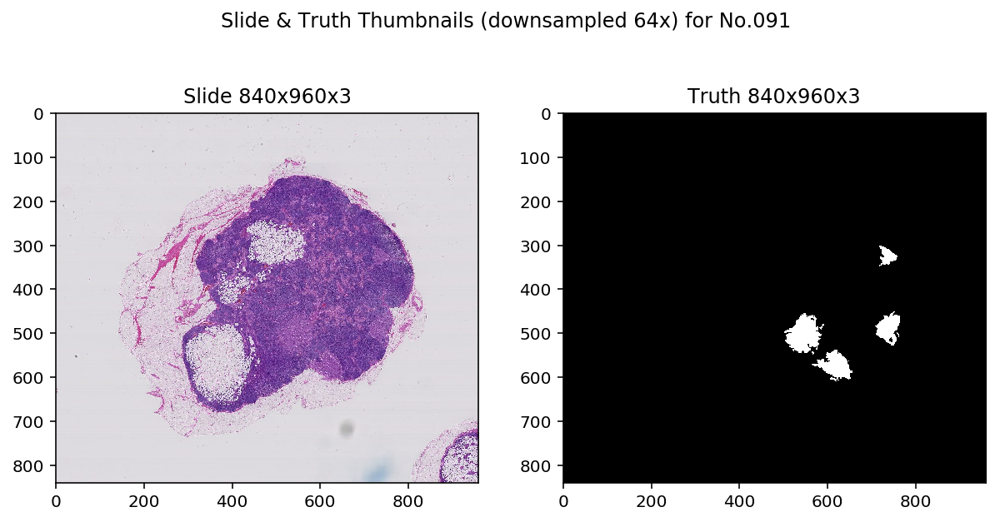

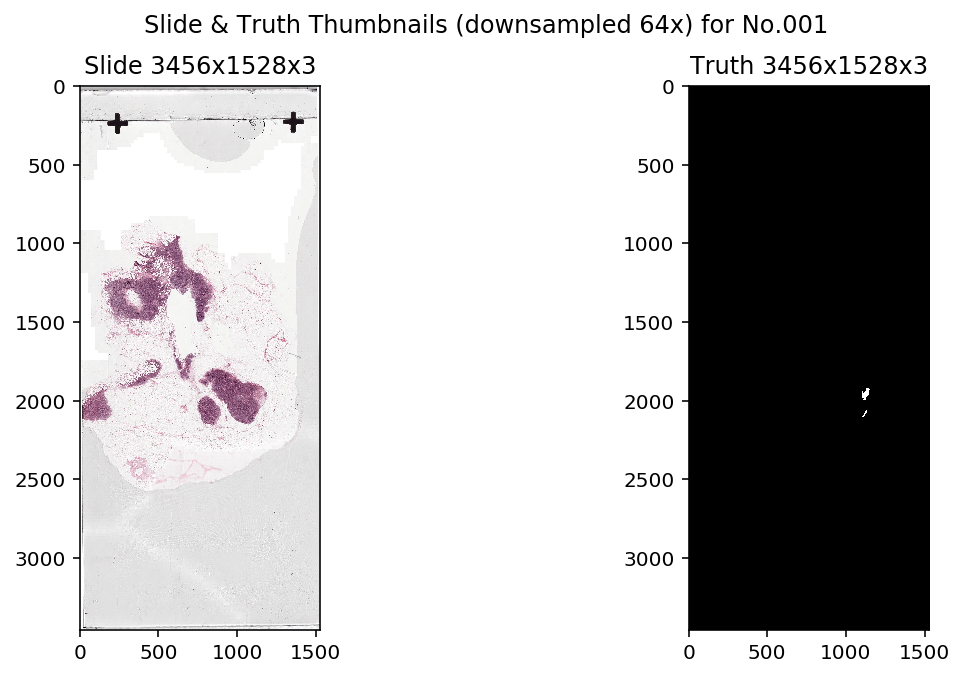

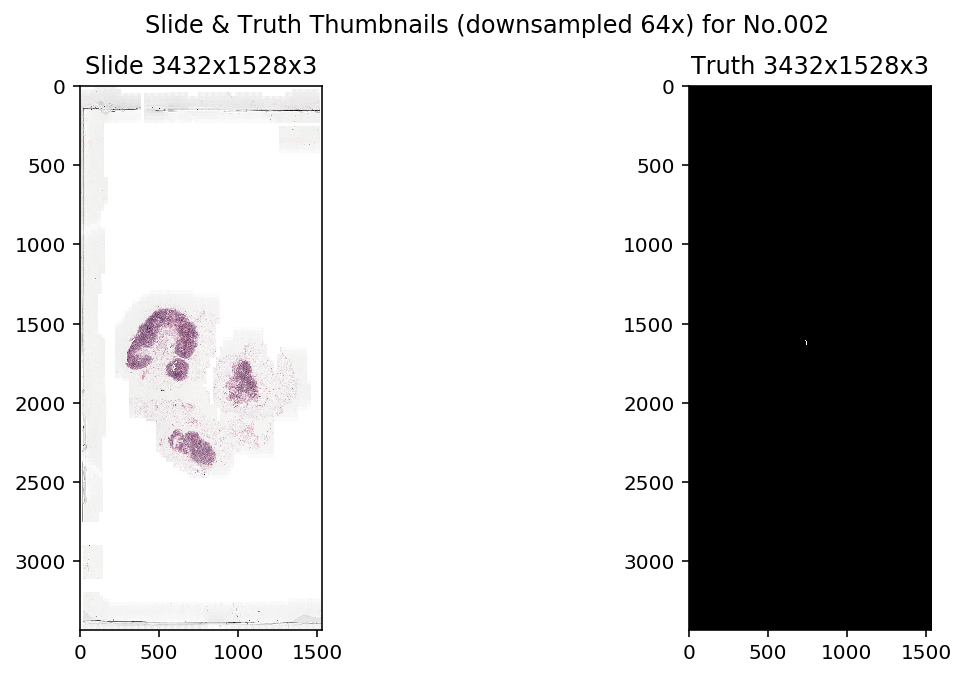

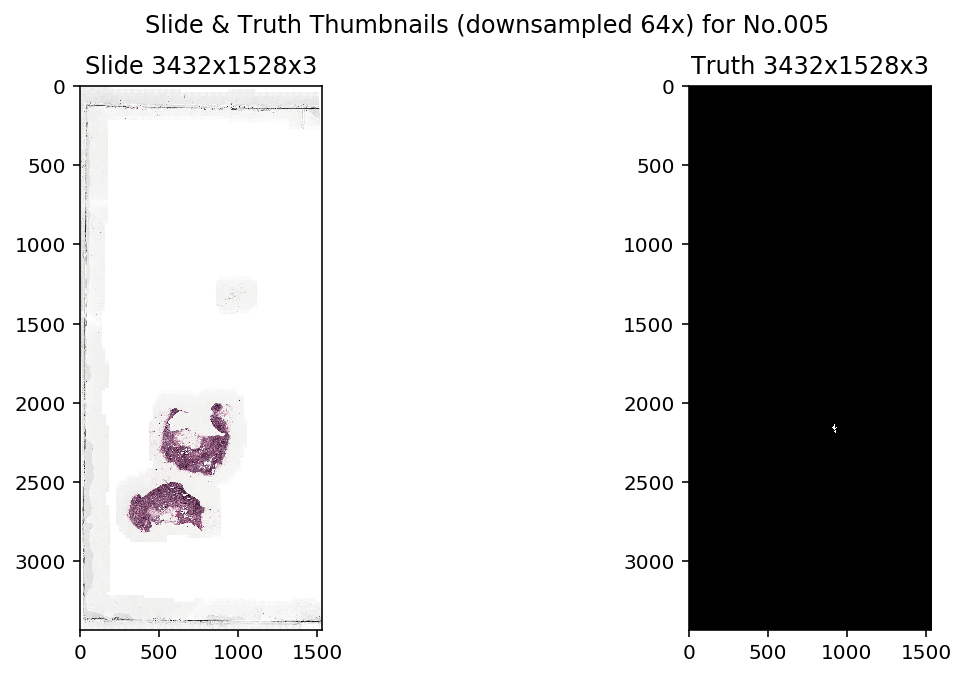

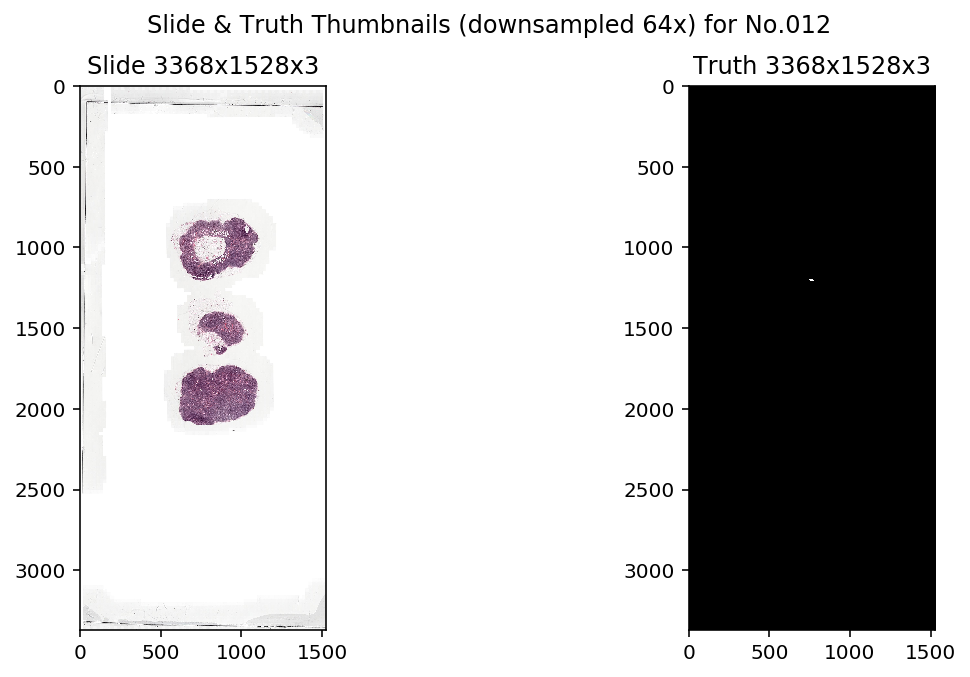

...

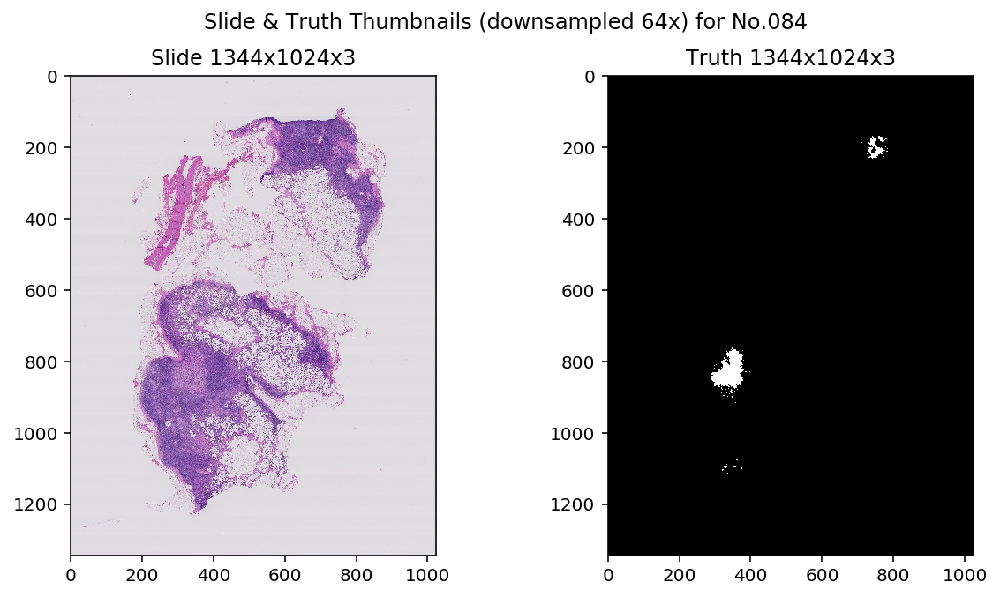

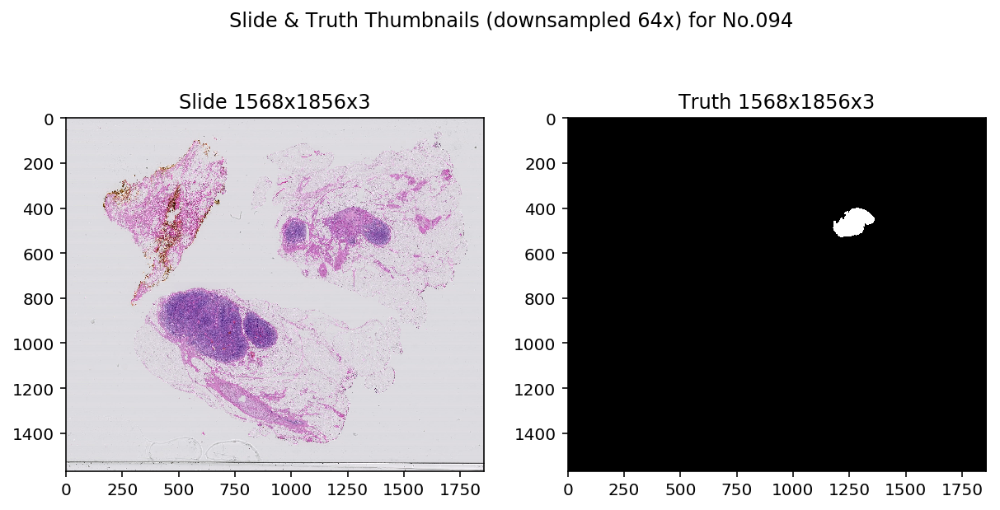

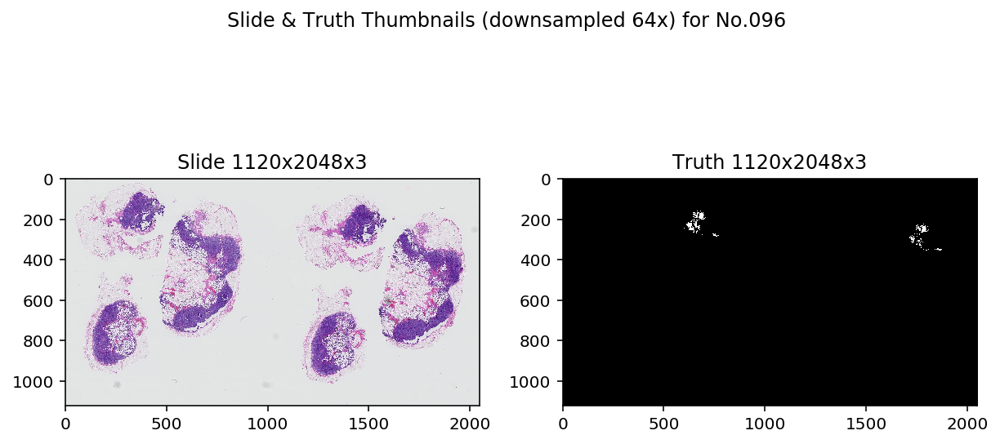

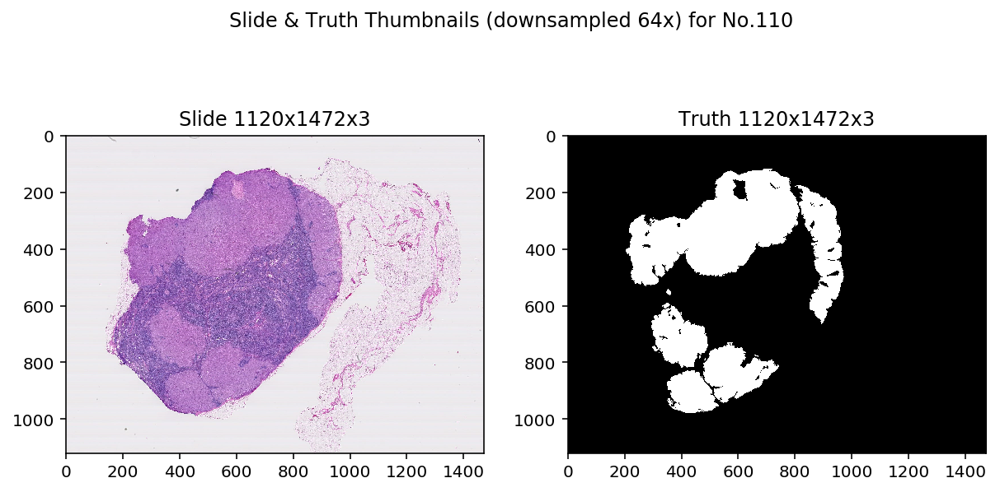

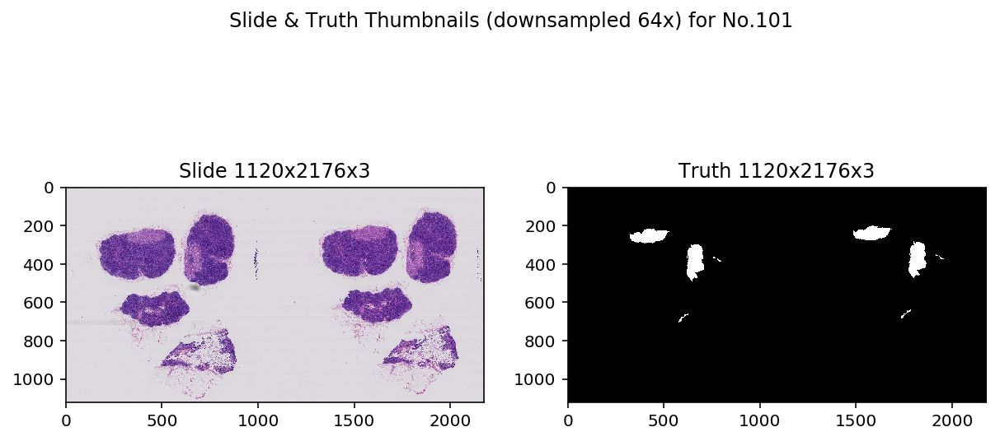

In [0]:
# Just check it at the first time.
# Show all thumbnails to get a overview of the dataset and check if evrything is alright.
slide_gen = load_slide()
truth_gen = load_truth()
while 1:
    try:  
        num, slide = next(slide_gen)
        _, truth = next(truth_gen)
        thumbnail = read_slide(slide, 
                         x=0, 
                         y=0, 
                         level=6, 
                         width=slide.level_dimensions[6][0], 
                         height=slide.level_dimensions[6][1])
        thumbnail_truth = read_slide(truth, 
                         x=0, 
                         y=0, 
                         level=6, 
                         width=slide.level_dimensions[6][0], 
                         height=slide.level_dimensions[6][1])
        f, axes = plt.subplots(1, 2, figsize=(10, 5));
        ax = axes.ravel()
        ax[0].imshow(thumbnail);
        ax[0].set_title('Slide %dx%dx%d' % thumbnail.shape)
        ax[1].imshow(rgb2gray(thumbnail_truth), cmap='gray');
        ax[1].set_title('Truth %dx%dx%d' % thumbnail_truth.shape)
        f.suptitle('Slide & Truth Thumbnails (downsampled 64x) for No.' + num);
    except Exception as e:
        break

We'll break this huge image into 256x256x3 patches for training.

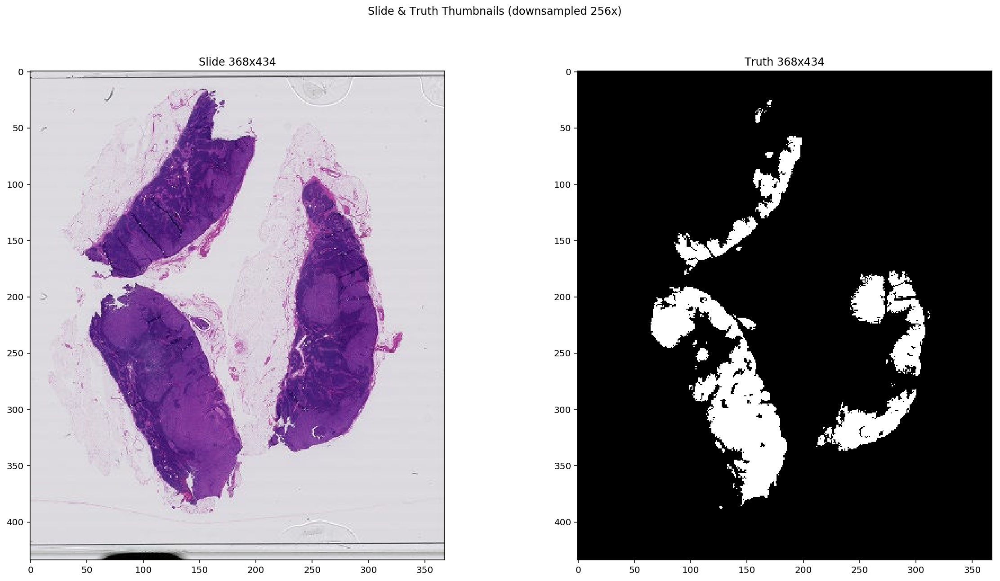

In [54]:
thumbnail = slide.get_thumbnail((slide.dimensions[0] / 256, slide.dimensions[1] / 256))
thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 256, truth.dimensions[1] / 256)) 

f, axes = plt.subplots(1, 2, figsize=(20, 10));
ax = axes.ravel()
ax[0].imshow(thumbnail);
ax[0].set_title('Slide %dx%d' % thumbnail.size)
ax[1].imshow(thumbnail_truth.convert('L'), cmap='gray');
ax[1].set_title('Truth %dx%d' % thumbnail_truth.size)
f.suptitle('Slide & Truth Thumbnails (downsampled 256x)');

Each pixel in this thumbnail corresponds to a 256x256 patch that can be used for training.  White areas in truth mask are cancer regions.

## Tissue area selection

While starter code provide a way to find tissue by their intensity, we can use Otsu's method to easily find the optimal threshold to find areas on slide with tissue.  Pixels with binary==False will be set of patches available for training.

In [0]:
from skimage.filters import threshold_otsu

img = np.array(thumbnail.convert('L')) # convert to grayscale
thresh = threshold_otsu(img)
binary = img > thresh

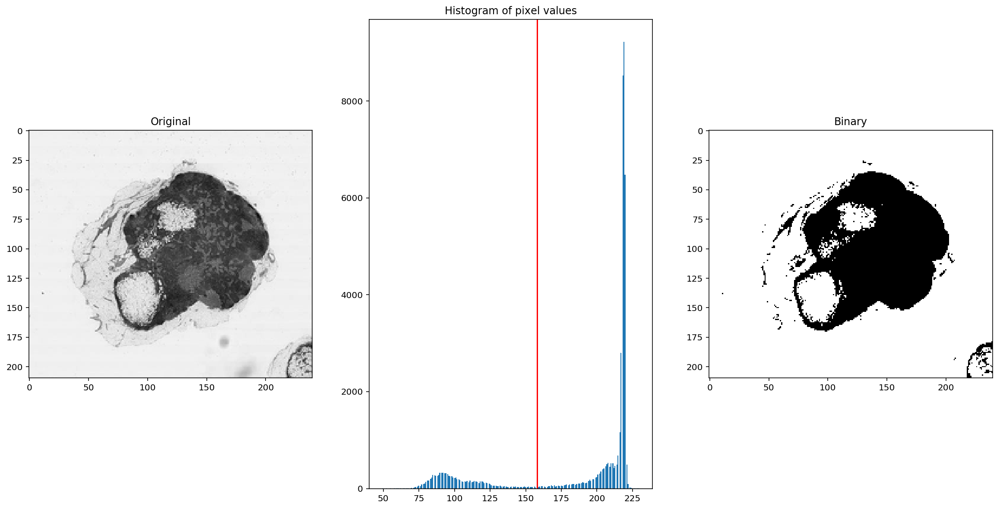

In [19]:
f, axes = plt.subplots(1, 3, figsize=(20, 10));
ax = axes.ravel();
ax[0].imshow(img, cmap='gray');
ax[0].set_title('Original');
ax[1].hist(img.ravel(), bins=256);
ax[1].set_title('Histogram of pixel values');
ax[1].axvline(thresh, color='r');
ax[2].imshow(binary, cmap='gray');
ax[2].set_title('Binary');

In [0]:
from openslide.deepzoom import DeepZoomGenerator 

tiles = DeepZoomGenerator(slide, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth = DeepZoomGenerator(truth, tile_size=256, overlap=0, limit_bounds=False)

## Data generator

In consider about the size of data, store them on disk would cost a lot of time and still unreliable in colab. We decide to store our tiles information in a pandas dataframe and use a generator to yield images to our model for training. 

In [0]:
def find_patches_from_slide(slide_path, filter_non_tissue=True):
    """Returns a dataframe of all patches in slide
    input: slide_path: path to WSI file
    output: samples: dataframe with the following columns:
        slide_path: path of slide
        is_tissue: sample contains tissue
        is_tumor: truth status of sample
        tile_loc: coordinates of samples in slide
    option: filter_non_tissue: Remove samples no tissue detected
    """
    slide_contains_tumor = osp.basename(slide_path).startswith('tumor_')
    
    with openslide.open_slide(slide_path) as slide:
        thumbnail = slide.get_thumbnail((slide.dimensions[0] / 256, slide.dimensions[1] / 256))
    
    # Check if it's issue.
    thumbnail_grey = np.array(thumbnail.convert('L')) # convert to grayscale
    thresh = threshold_otsu(thumbnail_grey)
    binary = thumbnail_grey > thresh
    
    patches = pd.DataFrame(pd.DataFrame(binary).stack())
    patches['is_tissue'] = ~patches[0]
    patches.drop(0, axis=1, inplace=True)
    patches['slide_path'] = slide_path
    
    # Get mask if tumor slide exist.
    if slide_contains_tumor:
        truth_slide_path = slide_path.replace('.tif', '_mask.tif')
        print("truth_slide_path", truth_slide_path)
        with openslide.open_slide(str(truth_slide_path)) as truth:
            thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 256, truth.dimensions[1] / 256)) 
        
        # Track if the tile we just read is tumor.
        patches_y = pd.DataFrame(pd.DataFrame(np.array(thumbnail_truth.convert("L"))).stack())
        patches_y['is_tumor'] = patches_y[0] > 0
        patches_y.drop(0, axis=1, inplace=True)

        samples = pd.concat([patches, patches_y], axis=1)
    else:
        samples = patches
        samples['is_tumor'] = False
    
    if filter_non_tissue:
        samples = samples[samples.is_tissue == True] # remove patches with no tissue
    samples['tile_loc'] = list(samples.index)
    samples.reset_index(inplace=True, drop=True)
    return samples 

In [57]:
# start with one slide
slide_path = '/content/gdrive/My Drive/slides/tumor_078.tif'
#slide_path = '/content/gdrive/My Drive/slides/' + slide_paths[0]
print(slide_path)
samples = find_patches_from_slide(slide_path)
print('Total patches in slide: %d' % len(samples))
samples.loc[:10]
samples.is_tumor.value_counts()

/content/gdrive/My Drive/slides/tumor_078.tif
truth_slide_path /content/gdrive/My Drive/slides/tumor_078_mask.tif
Total patches in slide: 41509


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/gdrive/My Drive/slides/tumor_078.tif,False,"(3, 321)"
1,True,/content/gdrive/My Drive/slides/tumor_078.tif,False,"(3, 322)"
2,True,/content/gdrive/My Drive/slides/tumor_078.tif,False,"(3, 323)"
3,True,/content/gdrive/My Drive/slides/tumor_078.tif,False,"(3, 324)"
4,True,/content/gdrive/My Drive/slides/tumor_078.tif,False,"(3, 325)"
5,True,/content/gdrive/My Drive/slides/tumor_078.tif,False,"(3, 326)"
6,True,/content/gdrive/My Drive/slides/tumor_078.tif,False,"(3, 327)"
7,True,/content/gdrive/My Drive/slides/tumor_078.tif,False,"(3, 328)"
8,True,/content/gdrive/My Drive/slides/tumor_078.tif,False,"(3, 329)"
9,True,/content/gdrive/My Drive/slides/tumor_078.tif,False,"(3, 330)"


False    26713
True     14796
Name: is_tumor, dtype: int64

In [12]:
import cv2
from keras.utils.np_utils import to_categorical

NUM_CLASSES = 2 # not_tumor, tumor

def gen_imgs(samples, batch_size, shuffle=True):
    """This function returns a generator that 
    yields tuples of (
        X: tensor, float - [batch_size, 256, 256, 3]
        y: tensor, int32 - [batch_size, 256, 256, NUM_CLASSES]
    )   
    input: samples: samples dataframe
    input: batch_size: The number of images to return for each pull
    output: yield (X_train, y_train): generator of X, y tensors
    option: shuffle: bool, if True shuffle samples
    """
    
    num_samples = len(samples)
    while 1: # Loop forever so the generator never terminates
        if shuffle:
            samples = samples.sample(frac=1) # shuffle samples
        
        for offset in range(0, num_samples, batch_size):
            batch_samples = samples.iloc[offset:offset+batch_size]
        
            images = []
            masks = []
            for _, batch_sample in batch_samples.iterrows():
                #print("batch_sample", batch_sample)
                slide_contains_tumor = osp.basename(batch_sample.slide_path).startswith('tumor_')
                #print("batch_sample.slide_path", batch_sample.slide_path)
                
                with openslide.open_slide(str(batch_sample.slide_path)) as slide:
                    x, y = batch_sample.tile_loc[::-1]
                    level = 0
                    width = height = 256
                    img = read_slide(slide, x*256, y*256, level, width, height, as_float=False)
                    
                # only load truth mask for tumor slides
                if slide_contains_tumor:
                    truth_slide_path = batch_sample.slide_path.replace('.tif', '_mask.tif')
                    #print("truth_slide_path", truth_slide_path)
                    with openslide.open_slide(str(truth_slide_path)) as truth:
                        x, y = batch_sample.tile_loc[::-1]
                        level = 0
                        width = height = 256
                        mask = read_slide(truth, x*256, y*256, level, width, height, as_float=False)
                        mask = (cv2.cvtColor(np.array(mask), cv2.COLOR_RGB2GRAY) > 0).astype(int)
                else:
                    mask = np.zeros((256, 256))

                images.append(np.array(img))
                masks.append(mask)

            X_train = np.array(images)
            y_train = np.array(masks)
            y_train = to_categorical(y_train, num_classes=2).reshape(y_train.shape[0], 256, 256, 2)
            yield X_train, y_train

Using TensorFlow backend.


Our model output and label tensors are of shape batch_sizex256x256x2.  So for each pixel we have a probability that they belong to class [not_tumor, tumor].  Label tensors are binary [0, 1].

## some examples (optional)

In [0]:
sample_gen = gen_imgs(samples.sample(32, random_state=42), 32, shuffle=False)

In [60]:
%time example_X, example_y  = next(sample_gen)

CPU times: user 628 ms, sys: 500 ms, total: 1.13 s
Wall time: 46.9 s


In [61]:
example_X.shape

(32, 256, 256, 3)

In [62]:
example_y.shape

(32, 256, 256, 2)

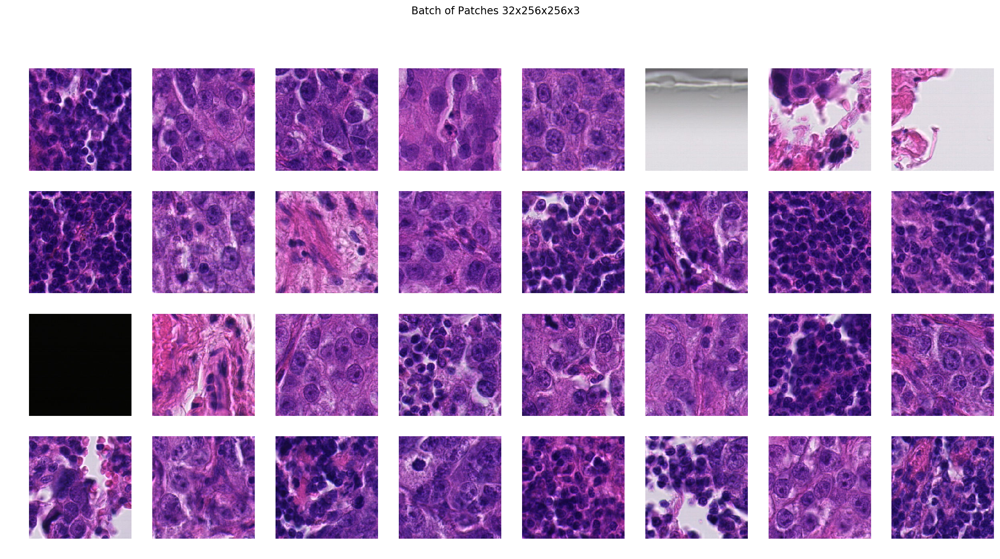

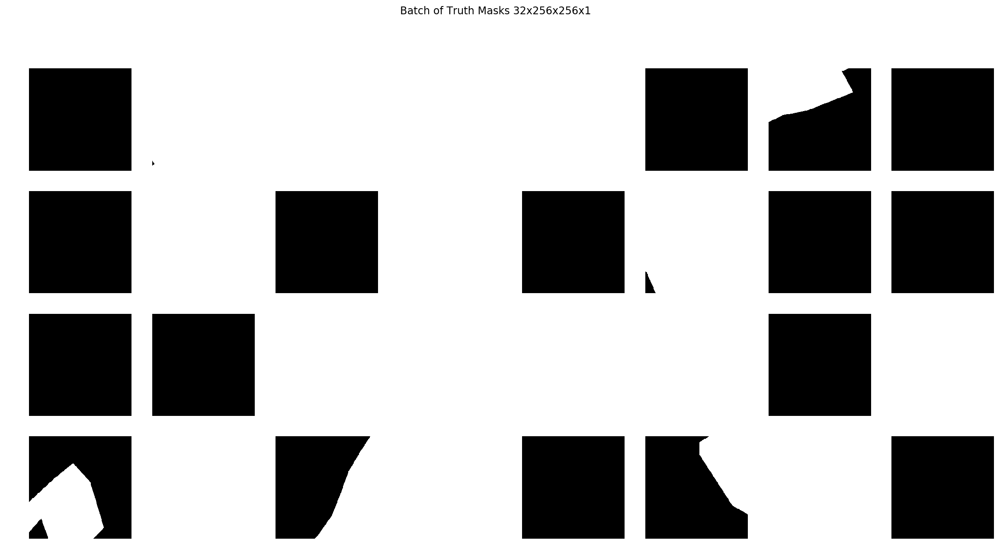

In [63]:
f, axes = plt.subplots(4, 8, figsize=(20, 10));
ax = axes.flatten()
for i in range(0, example_X.shape[0]):
    _ = ax[i].imshow(example_X[i]);
    _ = ax[i].axis('off');
f.suptitle('Batch of Patches 32x256x256x3');
    
f, axes = plt.subplots(4, 8, figsize=(20, 10));
ax = axes.flatten()    
for i in range(0, example_X.shape[0]):
    _ = ax[i].imshow(example_y[i].argmax(axis=2), cmap='gray', vmin=0, vmax=1);
    _ = ax[i].axis('off');
f.suptitle('Batch of Truth Masks 32x256x256x1');

## Define network

This first image segmentation model is based on a fully convolutional network used to predict the left ventricle from cardiac MRI scans (described [here](https://gist.github.com/ajsander/b65061d12f50de3cef5d#file-fcn_tutorial-ipynb)).

Architecture:

0. Lambda, Normalize input (x / 255.0 - 0.5), outputs 256x256x3
1. Convolution1, 5 x 5 kernel, stride 2, outputs 128x128x100
2. Maxpooling1, 2 x 2 window, stride 2, outputs 64x64x100
3. Convolution2, 5 x 5 kernel, stride 2, outputs 32x32x200
4. Maxpooling2, 2 x 2 window, stride 2, outputs 16x16x200
5. Convolution3, 3 x 3 kernel, stride 1, outputs 16x16x300
6. Convolution4, 3 x 3 kernel, stride 1, outputs 16x16x300
7. Dropout, 0.1 rate
8. Convolution5, 1x1 kernel, stride 1, outputs 16x16x2
9. Deconvolution, 31 x 31 kernel, stride 16, outputs 256x256x2

This network is 6 layers deep with 1.8 M trainable parameters.

In [0]:
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, Dense, Dropout, Flatten, MaxPooling2D, Lambda
#from tensorflow.keras.applications import ResNet50, InceptionV3

model = Sequential()
model.add(Lambda(lambda x: x / 255.0 - 0.5, input_shape=(256, 256, 3)))
model.add(Conv2D(100, (5, 5), strides=(2, 2), activation='elu', padding='same'))
model.add(MaxPooling2D())
model.add(Conv2D(200, (5, 5), strides=(2, 2), activation='elu', padding='same'))
model.add(MaxPooling2D())
model.add(Conv2D(300, (3, 3), activation='elu', padding='same'))
model.add(Conv2D(300, (3, 3), activation='elu',  padding='same'))
model.add(Dropout(0.1))
model.add(Conv2D(2, (1, 1))) # this is called upscore layer for some reason?
model.add(Conv2DTranspose(2, (31, 31), strides=(16, 16), activation='softmax', padding='same'))

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [14]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lambda (Lambda)              (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 128, 128, 100)     7600      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 64, 100)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 32, 200)       500200    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 200)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 16, 300)       540300    
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 300)       8

We're using ELU activations instead of RELU units.  I've seen better performance with these, and they address the vanishing gradient problem.
There's a dropout layer after our main conv layers.  We're using cross-entropy of our softmax predictions as our loss function to measure model performance.  

## Train model

In [0]:
BATCH_SIZE = 32
N_EPOCHS = 10

NUM_SAMPLES = 10000

In [176]:
# # Start with one slide.
# slide_path = '/content/tumor_078.tif'       
# samples = find_patches_from_slide(slide_path)
# samples.is_tumor.value_counts()
# samples = samples.sample(NUM_SAMPLES, random_state=42)
# samples.reset_index(drop=True, inplace=True)
# samples.is_tumor.value_counts()
# samples[:10]

truth_slide_path /content/gdrive/My Drive/slides/tumor_078_mask.tif


False    26713
True     14796
Name: is_tumor, dtype: int64

False    19355
True     10645
Name: is_tumor, dtype: int64

,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/tumor_078.tif,False,"(282, 240)"
1,True,/content/tumor_078.tif,True,"(287, 150)"
2,True,/content/tumor_078.tif,True,"(77, 185)"
3,True,/content/tumor_078.tif,True,"(287, 161)"
4,True,/content/tumor_078.tif,True,"(335, 168)"
5,True,/content/tumor_078.tif,False,"(5, 122)"
6,True,/content/tumor_078.tif,True,"(365, 172)"
7,True,/content/tumor_078.tif,False,"(238, 329)"
8,True,/content/tumor_078.tif,False,"(213, 291)"
9,True,/content/tumor_078.tif,True,"(222, 133)"


In [56]:
# Use this to use all slides.
samples = pd.DataFrame(columns=['is_tissue', 'slide_path', 'is_tumor', 'tile_loc'])

# Indicate how many slides we are choosing.
#slides_num = len(slide_paths)
offset = 7
slides_num = 10

for i in range(offset, offset + slides_num):
    slide_path = BASE_ADDRESS + 'My Drive/my_slides/' + slide_paths[i]
    samples = samples.append(find_patches_from_slide(slide_path),ignore_index=True)
    print('Total patches in slide: %d' % len(samples))
    #all_tissue_samples.loc[:10]
    samples.is_tumor.value_counts()

truth_slide_path /content/gdrive/My Drive/my_slides/tumor_023_mask.tif
Total patches in slide: 13325


False    13296
True        29
Name: is_tumor, dtype: int64

truth_slide_path /content/gdrive/My Drive/my_slides/tumor_031_mask.tif
Total patches in slide: 24101


False    22206
True      1895
Name: is_tumor, dtype: int64

truth_slide_path /content/gdrive/My Drive/my_slides/tumor_035_mask.tif
Total patches in slide: 37531


False    35633
True      1898
Name: is_tumor, dtype: int64

truth_slide_path /content/gdrive/My Drive/my_slides/tumor_057_mask.tif
Total patches in slide: 49984


False    48066
True      1918
Name: is_tumor, dtype: int64

truth_slide_path /content/gdrive/My Drive/my_slides/tumor_059_mask.tif
Total patches in slide: 62343


False    60421
True      1922
Name: is_tumor, dtype: int64

truth_slide_path /content/gdrive/My Drive/my_slides/tumor_064_mask.tif
Total patches in slide: 78640


False    74931
True      3709
Name: is_tumor, dtype: int64

truth_slide_path /content/gdrive/My Drive/my_slides/tumor_075_mask.tif
Total patches in slide: 89215


False    84911
True      4304
Name: is_tumor, dtype: int64

truth_slide_path /content/gdrive/My Drive/my_slides/tumor_078_mask.tif
Total patches in slide: 130724


False    111624
True      19100
Name: is_tumor, dtype: int64

truth_slide_path /content/gdrive/My Drive/my_slides/tumor_081_mask.tif
Total patches in slide: 145867


False    126760
True      19107
Name: is_tumor, dtype: int64

truth_slide_path /content/gdrive/My Drive/my_slides/tumor_084_mask.tif
Total patches in slide: 161489


False    141923
True      19566
Name: is_tumor, dtype: int64

In [0]:
false_sample_num = true_sample_num = NUM_SAMPLES // 2
true_samples = samples[samples['is_tumor']== True].sample(true_sample_num, random_state=42)
false_samples = samples[samples['is_tumor']== False].sample(false_sample_num, random_state=42)
samples = true_samples.append(false_samples)
samples.reset_index(drop=True, inplace=True)

In [58]:
# show some example of training data.
print(samples.shape)
samples[0:20]
samples.is_tumor.value_counts()

(10000, 4)


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/gdrive/My Drive/my_slides/tumor_064.tif,True,"(553, 330)"
1,True,/content/gdrive/My Drive/my_slides/tumor_078.tif,True,"(317, 162)"
2,True,/content/gdrive/My Drive/my_slides/tumor_078.tif,True,"(321, 140)"
3,True,/content/gdrive/My Drive/my_slides/tumor_078.tif,True,"(305, 286)"
4,True,/content/gdrive/My Drive/my_slides/tumor_078.tif,True,"(115, 177)"
5,True,/content/gdrive/My Drive/my_slides/tumor_078.tif,True,"(208, 76)"
6,True,/content/gdrive/My Drive/my_slides/tumor_078.tif,True,"(316, 170)"
7,True,/content/gdrive/My Drive/my_slides/tumor_078.tif,True,"(304, 124)"
8,True,/content/gdrive/My Drive/my_slides/tumor_078.tif,True,"(346, 153)"
9,True,/content/gdrive/My Drive/my_slides/tumor_078.tif,True,"(208, 108)"


True     5000
False    5000
Name: is_tumor, dtype: int64

In [0]:
from sklearn.model_selection import StratifiedShuffleSplit

# split samples into train and validation set
# use StratifiedShuffleSplit to ensure both sets have same proportions of tumor patches
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in split.split(samples, samples["is_tumor"]):
        train_samples = samples.loc[train_index]
        validation_samples = samples.loc[test_index]

In [0]:
from datetime import datetime

## TODO Add checkpoint mechanism to save old model before generating new

train_generator = gen_imgs(train_samples, BATCH_SIZE)
validation_generator = gen_imgs(validation_samples, BATCH_SIZE)

# Train model
train_start_time = datetime.now()
model.fit_generator(train_generator, np.ceil(len(train_samples) / BATCH_SIZE),
    validation_data=validation_generator,
    validation_steps=np.ceil(len(validation_samples) / BATCH_SIZE),
    epochs=N_EPOCHS)

train_end_time = datetime.now()
print("Model training time: %.1f minutes" % ((train_end_time - train_start_time).seconds / 60,))

Epoch 1/10
250/250 [==============================] - 133s 532ms/step - loss: 0.3484 - accuracy: 0.8350 - val_loss: 0.2216 - val_accuracy: 0.9121
Epoch 2/10
250/250 [==============================] - 127s 509ms/step - loss: 0.2165 - accuracy: 0.9144 - val_loss: 0.1841 - val_accuracy: 0.9320
Epoch 3/10
250/250 [==============================] - 128s 511ms/step - loss: 0.1786 - accuracy: 0.9326 - val_loss: 0.1474 - val_accuracy: 0.9446
Epoch 4/10
250/250 [==============================] - 128s 510ms/step - loss: 0.1543 - accuracy: 0.9418 - val_loss: 0.1607 - val_accuracy: 0.9365
Epoch 5/10
250/250 [==============================] - 129s 515ms/step - loss: 0.1507 - accuracy: 0.9441 - val_loss: 0.1664 - val_accuracy: 0.9378
Epoch 6/10
250/250 [==============================] - 129s 517ms/step - loss: 0.1389 - accuracy: 0.9492 - val_loss: 0.1337 - val_accuracy: 0.9502
Epoch 7/10
250/250 [==============================] - 127s 508ms/step - loss: 0.1407 - accuracy: 0.9477 - val_loss: 0.1398 -

Model training time: 21.4 minutes


In [0]:
# Save model
timestr = 'FCN_' + time.strftime("%Y%m%d-%H%M%S") + '.h5'
print(timestr) 
model.save(timestr)

FCN_20190517-223739.h5


In [0]:
acc = history.history['acc']
val_acc = history.history['val_acc']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(1, EPOCHS+1)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Evaluate model

### Predict single patches

In [0]:
from tensorflow.keras.models import Sequential, load_model

In [0]:
model = load_model('/content/FCN_20190517-223739.h5')

In [0]:
def predict_from_model(patch, model):
    """Predict which pixels are tumor.
    
    input: patch: 256x256x3, rgb image
    input: model: keras model
    output: prediction: 256x256x1, per-pixel tumor probability
    """
    
    prediction = model.predict(patch.reshape(1, 256, 256, 3))
    prediction = prediction[:, :, :, 1].reshape(256, 256)
    return prediction

In [0]:
import matplotlib.gridspec as gridspec

def plot_blend(patch, prediction, ax, alpha=0.75):
    """alpha blend patch and prediction.
    https://matplotlib.org/examples/pylab_examples/layer_images.html
    
    input: patch: 256x256x3, rgb image
    input: prediction: 256x256x1, per-pixel tumor probability
    input: ax: maplotlib Axes object
    input: alpha: alpha blend
    """
    
    dx, dy = 0.05, 0.05
    x = np.arange(0, patch.shape[1] - 1, dx)
    y = np.arange(0, patch.shape[0] - 1, dy)
    xmin, xmax, ymin, ymax = np.amin(x), np.amax(x), np.amin(y), np.amax(y)
    extent = xmin, xmax, ymin, ymax

    # fig = plt.figure(frameon=False, figsize=(10, 5))
    Z1 = cv2.cvtColor(patch, code=cv2.COLOR_RGB2GRAY)
    Z2 = prediction

    im1 = ax.imshow(Z1, cmap='gray', extent=extent)
    im2 = ax.imshow(Z2, cmap='jet', alpha=alpha, vmin=0.0, vmax=1.0,
                     extent=extent)
    ax.axis('off');

def plot_patch_with_pred(patch, truth, prediction, title_str='', alpha=0.6):
    """
    input: patch: 256x256x3, rgb image
    input: truth: 256x256x2, onehot output classes (not_tumor, tumor)
    input: prediction: 256x256x1, per-pixel tumor probability
    """
    gs = gridspec.GridSpec(2, 4, width_ratios=[10, 10, 19, 1])
    ax0 = plt.subplot(gs[0, 0])
    ax1 = plt.subplot(gs[0, 1])
    ax2 = plt.subplot(gs[1, 0])
    ax3 = plt.subplot(gs[1, 1])
    ax4 = plt.subplot(gs[:, 2])
    axc = plt.subplot(gs[:, 3])

    ax0.imshow(patch);
    ax0.set_title('Original')
    
    ax1.imshow(truth.argmax(axis=2), cmap='gray', vmin=0, vmax=1);
    ax1.set_title('Truth mask (white=tumor, black=not_tumor)')
    
    p = ax2.imshow(prediction, cmap='jet', vmin=0, vmax=1);
    ax2.set_title('Prediction heatmap')

    ax3.imshow((prediction > 0.5).astype(np.int), cmap='gray', vmin=0, vmax=1);
    ax3.set_title('Prediction mask (white=tumor, black=not_tumor)')
    
    plot_blend(patch, prediction, ax4, alpha)
    ax4.set_title('Original+Prediction blend')
    
    fig = plt.gcf()
    fig.set_size_inches(20, 10)
    fig.suptitle(title_str)
    fig.colorbar(p, cax=axc, orientation="vertical")
    axc.set_title('Probability pixel is tumor')

#### Tumor patch

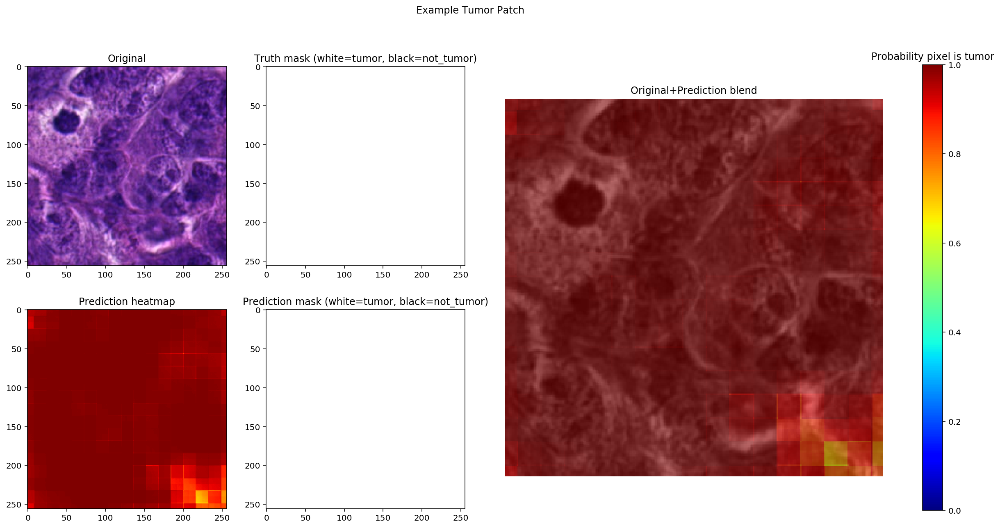

In [0]:
example_patch = example_X[27]
example_truth = example_y[27]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example Tumor Patch')

These calls look good.  Easy all tumor case.

count    65536.000000
mean         0.986530
std          0.032422
min          0.644791
25%          0.989131
50%          0.997020
75%          0.999278
max          0.999970
dtype: float64


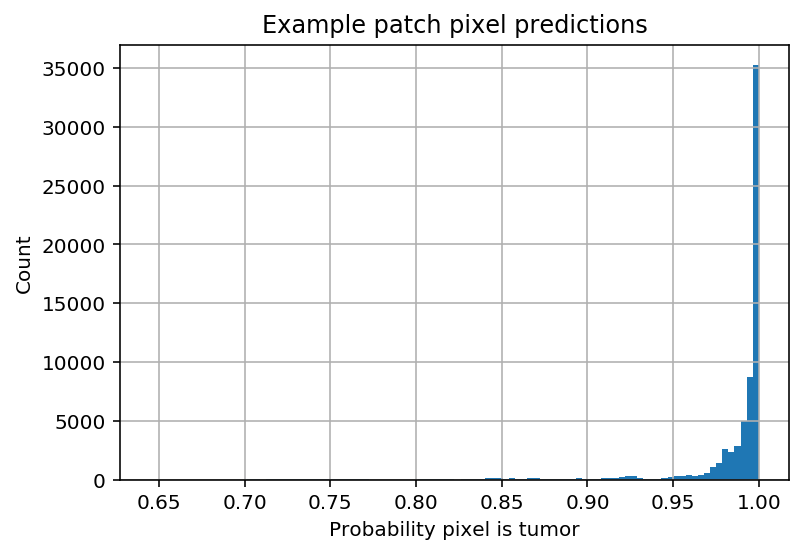

In [0]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

####Normal patch

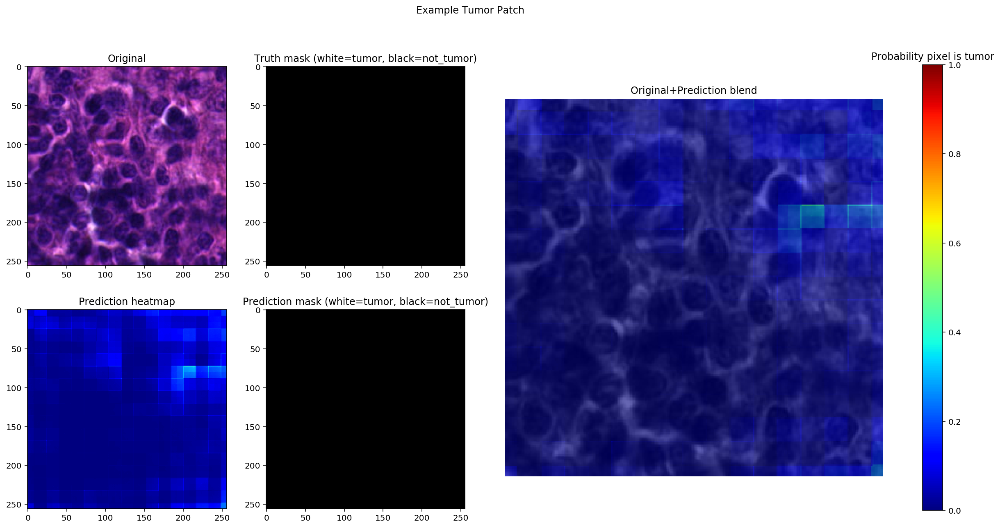

In [0]:
example_patch = example_X[28]
example_truth = example_y[28]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example Tumor Patch')

Normal case called correctly.

count    65536.000000
mean         0.034749
std          0.043233
min          0.000452
25%          0.006487
50%          0.018312
75%          0.047283
max          0.421287
dtype: float64


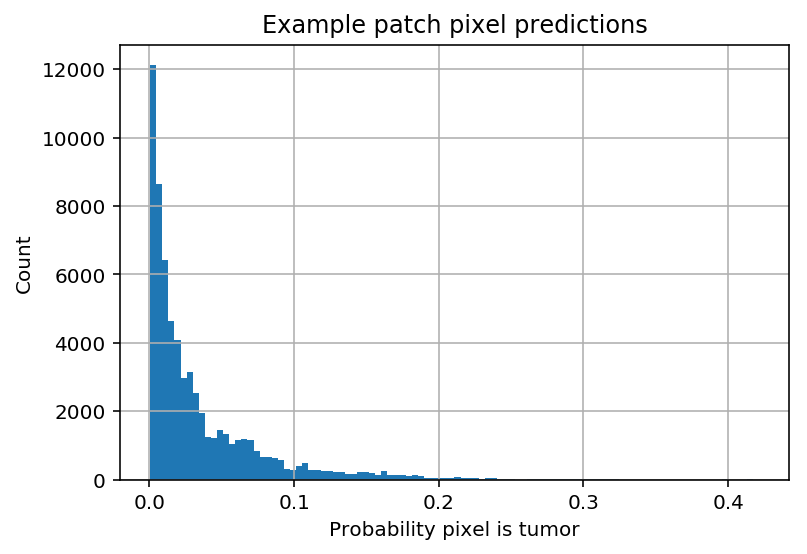

In [0]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

#### Tough border patch

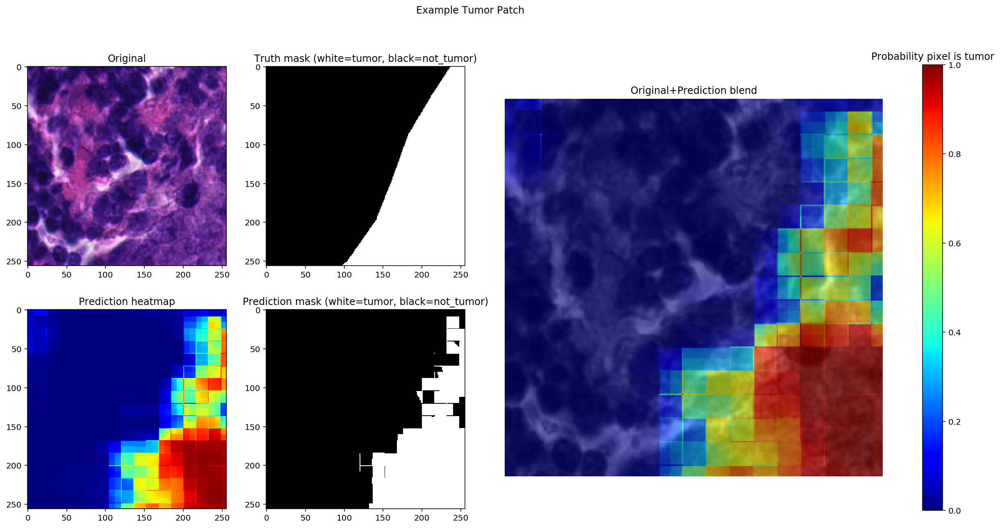

In [0]:
example_patch = example_X[26]
example_truth = example_y[26]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example Tumor Patch')

The model is predicting more tumor than expected.  I could see why it would be thinking the upper portion is cancer.

count    65536.000000
mean         0.232728
std          0.339399
min          0.000016
25%          0.001292
50%          0.011872
75%          0.473739
max          0.997906
dtype: float64


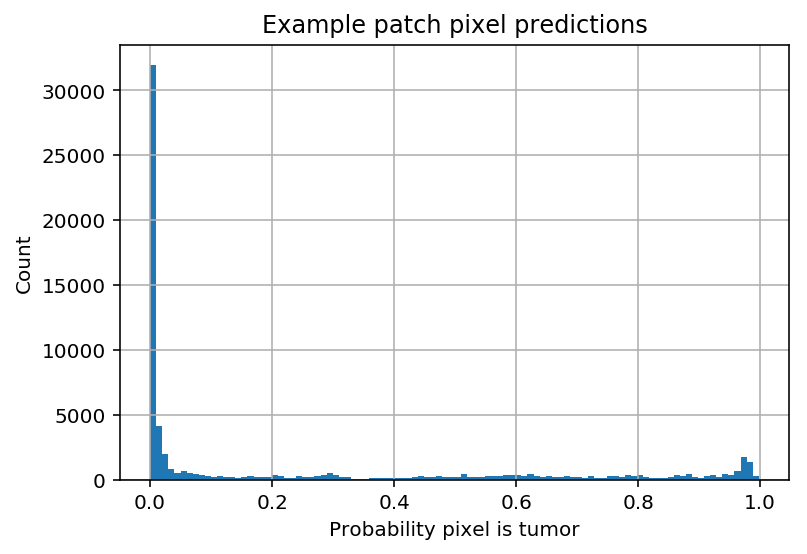

In [0]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

### Calculate Perfomance Metrics

In [0]:
from sklearn.metrics import confusion_matrix
from tqdm import tqdm

def predict_batch_from_model(patches, model):
    """Predict which pixels are tumor.
    
    input: patch: `batch_size`x256x256x3, rgb image
    input: model: keras model
    output: prediction: 256x256x1, per-pixel tumor probability
    """
    predictions = model.predict(patches)
    predictions = predictions[:, :, :, 1]
    return predictions

In [0]:
validation_generator = gen_imgs(validation_samples, BATCH_SIZE)
validation_steps = np.ceil(len(validation_samples) / BATCH_SIZE)

confusion_mtx = np.zeros((2, 2))

for i in tqdm(range(int(validation_steps))):
    X, y  = next(validation_generator)
    preds = predict_batch_from_model(X, model)
    
    y_true = y[:, :, :, 1].ravel()
    y_pred = np.uint8(preds > 0.5).ravel()
    
    confusion_mtx += confusion_matrix(y_true, y_pred, labels=[0, 1])













  0%|          | 0/63 [00:00<?, ?it/s]











  2%|▏         | 1/63 [00:07<07:16,  7.05s/it]











  3%|▎         | 2/63 [00:13<06:51,  6.75s/it]











  5%|▍         | 3/63 [00:19<06:29,  6.50s/it]











  6%|▋         | 4/63 [00:24<06:12,  6.31s/it]











  8%|▊         | 5/63 [00:30<05:58,  6.19s/it]











 10%|▉         | 6/63 [00:36<05:47,  6.10s/it]











 11%|█         | 7/63 [00:42<05:37,  6.03s/it]











 13%|█▎        | 8/63 [00:48<05:29,  5.99s/it]











 14%|█▍        | 9/63 [00:54<05:21,  5.95s/it]











 16%|█▌        | 10/63 [01:00<05:13,  5.92s/it]











 17%|█▋        | 11/63 [01:06<05:06,  5.90s/it]











 19%|█▉        | 12/63 [01:11<05:00,  5.89s/it]











 21%|██        | 13/63 [01:17<04:54,  5.90s/it]











 22%|██▏       | 14/63 [01:24<04:59,  6.12s/it]











 24%|██▍       | 15/63 [01:31<05:01,  6.28s/it]











 25%|██▌       | 16/63 [01:36<04:49,  6.15s/it]











 27

In [0]:
confusion_mtx

array([[83645523.,  1721968.],
       [ 4097129., 41607380.]])

In [0]:
tn = confusion_mtx[0, 0]
fp = confusion_mtx[0, 1]
fn = confusion_mtx[1, 0]
tp = confusion_mtx[1, 1]

In [0]:
accuracy = (tp + tn) / (tp + tn + fp + fn)
recall = tp / (tp + fn)
precision = tp / (tp + fp)
f1_score = 2 * ((precision * recall) / (precision + recall))

print("Accuracy: %.2f" % accuracy)
print("Recall: %.2f" % recall)
print("Precision: %.2f" % precision)
print("F1 Score: %.2f" % f1_score)

Accuracy: 0.96
Recall: 0.91
Precision: 0.96
F1 Score: 0.93


From confusion matrix, we could see this mode works well. 

### Predict whole slide

In [14]:
! unzip "/content/078.zip"

Archive:  /content/110.zip
  inflating: tumor_110_mask.tif      
  inflating: tumor_110.tif           


In [0]:
test_slide_path = '/content/tumor_078.tif'       
test_slide = open_slide(test_slide_path)

test_truth_path = '/content/tumor_078_mask.tif'
test_truth = open_slide(test_truth_path)

In [0]:
test_slide_path = '/content/tumor_078.tif' 
#test_slide_path = '/content/gdrive/My Drive/slides/tumor_078.tif' 
test_slide = open_slide(test_slide_path)
test_samples = find_patches_from_slide(test_slide_path, filter_non_tissue=False)
print('Total patches in slide: %d' % len(test_samples))
test_samples.iloc[:10]
test_samples.is_tumor.value_counts()

truth_slide_path /content/gdrive/My Drive/slides/tumor_078_mask.tif
Total patches in slide: 159712


,is_tissue,slide_path,is_tumor,tile_loc
0,False,/content/tumor_078.tif,False,"(0, 0)"
1,False,/content/tumor_078.tif,False,"(0, 1)"
2,False,/content/tumor_078.tif,False,"(0, 2)"
3,False,/content/tumor_078.tif,False,"(0, 3)"
4,False,/content/tumor_078.tif,False,"(0, 4)"
5,False,/content/tumor_078.tif,False,"(0, 5)"
6,False,/content/tumor_078.tif,False,"(0, 6)"
7,False,/content/tumor_078.tif,False,"(0, 7)"
8,False,/content/tumor_078.tif,False,"(0, 8)"
9,False,/content/tumor_078.tif,False,"(0, 9)"


False    144876
True      14836
Name: is_tumor, dtype: int64

In [0]:
len(test_samples[test_samples.is_tumor==True])

14836

In [0]:
from matplotlib import cm
from tqdm import tqdm

output_dir = Path('/content/viewers/Tumor_078/slide_files/')
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

alpha = 0.5

n_samples = len(test_samples)
n_cols = int(test_slide.dimensions[0] / 256)
n_rows = int(test_slide.dimensions[1] / 256)
#print("n_cols * n_rows == n_samples", n_cols, n_rows, n_samples)
assert n_cols * n_rows == n_samples

thumbnail = test_slide.get_thumbnail((n_cols, n_rows))
thumbnail = np.array(thumbnail)

batch_size = n_cols
# print("batch_size", batch_size)
# batch_size = 32
output_thumbnail_preds = list()
    
for offset in tqdm(list(range(0, n_samples, batch_size))):
    batch_samples = test_samples.iloc[offset:offset+batch_size]
    #batch_samples.iloc[-10:-1]
    png_fnames = batch_samples.tile_loc.apply(lambda coord: str(output_dir / ('%d_%d.png' % coord[::-1])))
    
    X, _ = next(gen_imgs(batch_samples, batch_size, shuffle=False))
    
    if batch_samples.is_tissue.nunique() == 1 and batch_samples.iloc[0].is_tissue == False:
        # all patches in this row do not have tissue, skip them all
        output_thumbnail_preds.append(np.zeros(batch_size, dtype=np.float32))
        
    else:
        # make predictions
        preds = predict_batch_from_model(X, model)
        output_thumbnail_preds.append(preds.mean(axis=(1,2)))
        

output_thumbnail_preds = np.array(output_thumbnail_preds)













  0%|          | 0/434 [00:00<?, ?it/s]

n_cols * n_rows == n_samples 368 434 159712
batch_size 368














  0%|          | 1/434 [00:04<32:10,  4.46s/it]











  0%|          | 2/434 [00:08<31:29,  4.37s/it]











  1%|          | 3/434 [00:12<30:44,  4.28s/it]











  1%|          | 4/434 [00:17<31:47,  4.44s/it]











  1%|          | 5/434 [00:22<32:33,  4.55s/it]











  1%|▏         | 6/434 [00:27<33:03,  4.63s/it]











  2%|▏         | 7/434 [00:31<31:43,  4.46s/it]











  2%|▏         | 8/434 [00:35<30:47,  4.34s/it]











  2%|▏         | 9/434 [00:39<30:09,  4.26s/it]











  2%|▏         | 10/434 [00:43<29:38,  4.19s/it]











  3%|▎         | 11/434 [00:47<29:17,  4.15s/it]











  3%|▎         | 12/434 [00:51<28:58,  4.12s/it]











  3%|▎         | 13/434 [00:55<28:45,  4.10s/it]











  3%|▎         | 14/434 [00:59<28:33,  4.08s/it]











  3%|▎         | 15/434 [01:03<28:24,  4.07s/it]











  4%|▎         | 16/434 [01:07<28:20,  4.07s/it]











  4%|▍         | 17/434 [01:12<30:01,

In [0]:
output_thumbnail_preds = output_thumbnail_preds.reshape(n_rows, n_cols)

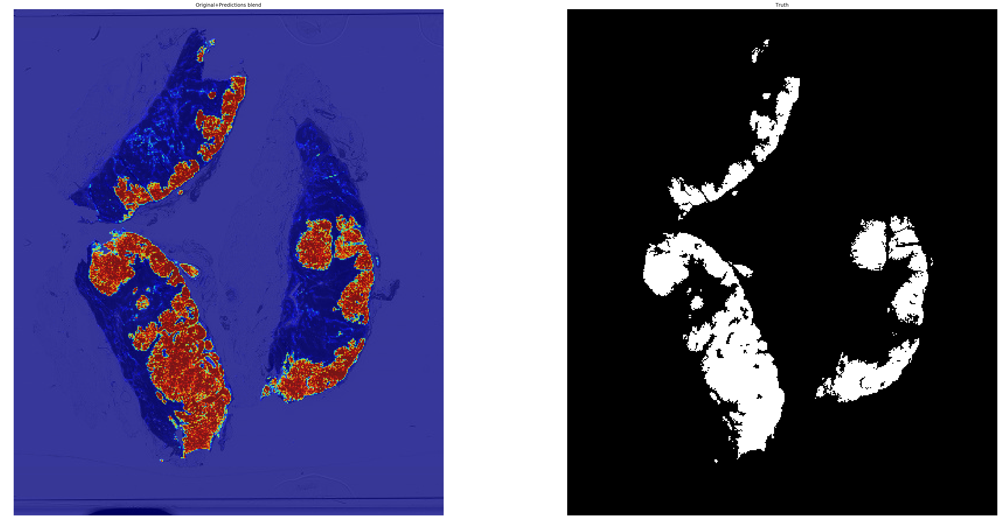

In [0]:
f, axes = plt.subplots(1, 2, figsize=(40, 18))
ax = axes.flatten()
plot_blend(thumbnail, output_thumbnail_preds, ax=ax[0])

thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 256, truth.dimensions[1] / 256)) 
ax[1].imshow(thumbnail_truth.convert('L'), cmap='gray');
ax[0].set_title('Original+Predictions blend')
ax[1].set_title('Truth')
ax[1].axis('off');
plt.tight_layout();

Final predictions for whole slide highlight 4 main tumor lesions in slide.